In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from skimage.morphology import erosion, dilation
from skimage import measure
from sklearn.cluster import KMeans

import cv2

In [ ]:
import os
# path = r"app_uploaded_files\chaos_samples\CHAOS_Volume001_slice000.png"
path =  r"app_uploaded_files/dog/dog.jpg"
print(os.path.exists(path))
print(os.getcwd())

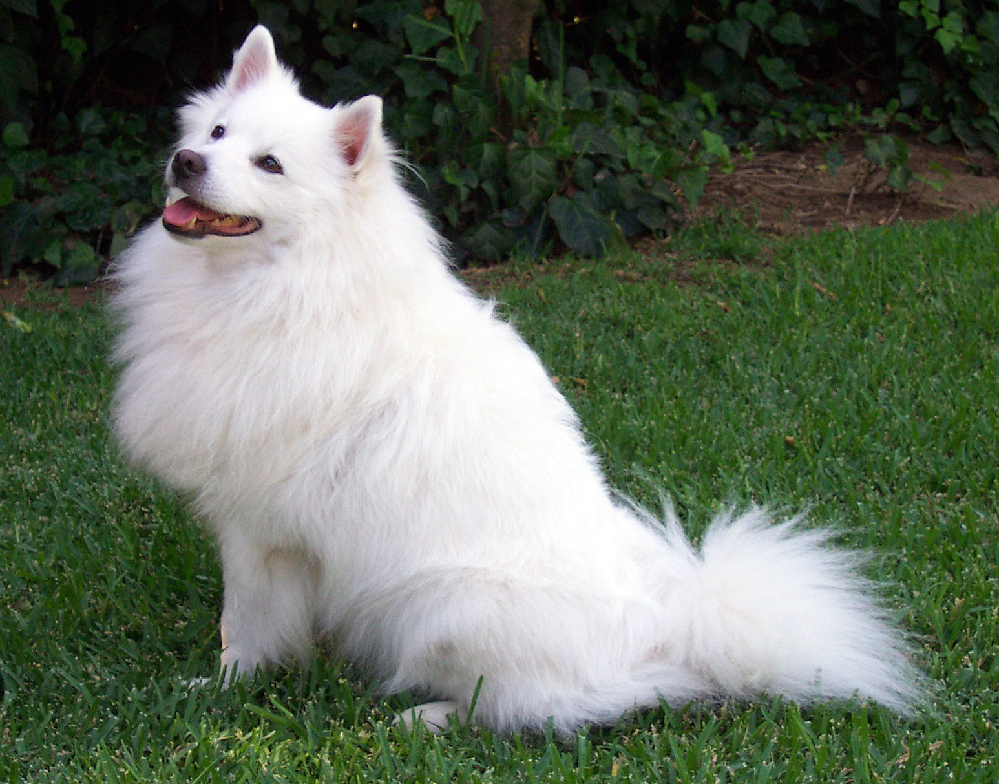

In [3]:
img = Image.open(path)
img

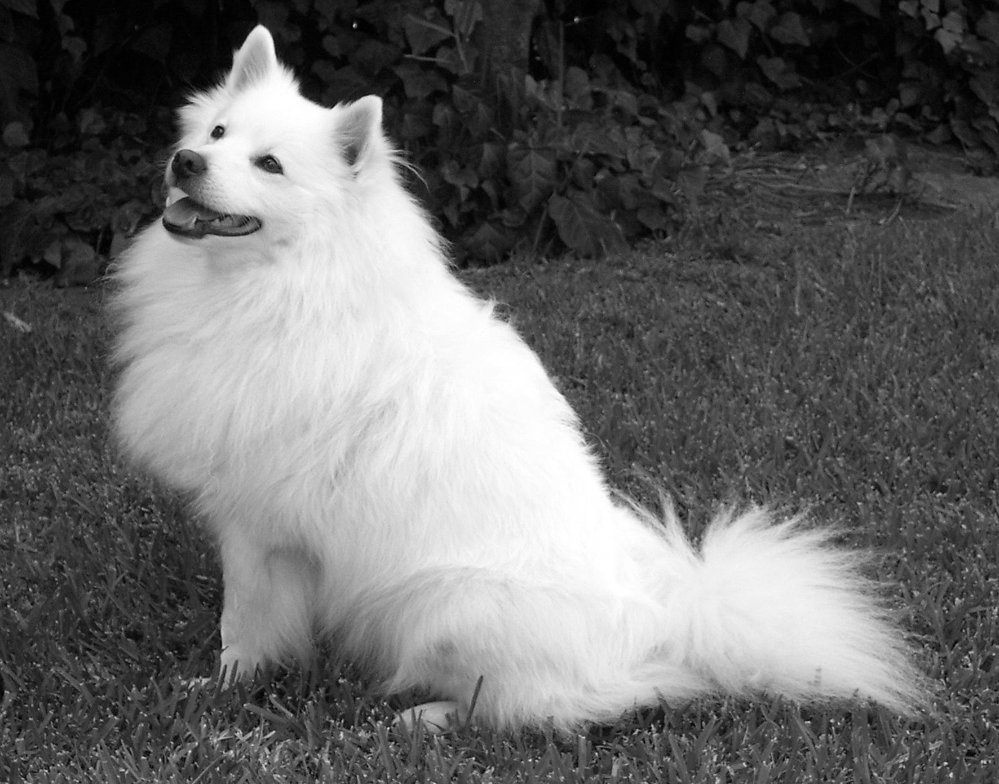

In [5]:
img.convert('L')

In [8]:
arr = np.array(img.convert('L'))
print(arr.dtype, arr.shape)

uint8 (1213, 1546)


In [9]:

# reference: https://www.raddq.com/dicom-processing-segmentation-visualization-in-python/
def kmeans_seg(img, zone=None):   
    data = {}
    data['image_origin'] = img
    #Standardize the pixel values
    row_size= img.shape[0]
    col_size = img.shape[1]

    mean = np.mean(img)
    std = np.std(img)
    img = img-mean
    img = img/std
    data['image_normalized'] = img

    # Find the average pixel value near the lungs
    # to renormalize washed out images
    if zone==None:
        # 认为默认的中心
        middle = img[int(col_size/8):int(col_size/8*7), int(row_size/8):int(row_size/8*7)]
    else:
        assert isinstance(zone, tuple) and len(zone)==4
        lower, upper, left, right = zone
        middle = img[lower:upper+1, left:right+1]

    mean = np.mean(middle)  
    max_ = np.max(img)
    min_ = np.min(img)
    # To improve threshold finding, I'm moving the 
    # underflow and overflow on the pixel spectrum
    img[img==max_]=mean
    img[img==min_]=mean

    # Using Kmeans to separate foreground (soft tissue / bone) and background (lung/air)
    kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
    centers = sorted(kmeans.cluster_centers_.flatten())
    threshold = np.mean(centers)
    thresh_img = np.where(img<threshold,1.0,0.0) 
    # data['image_threshold'] = thresh_img

    # First erode away the finer elements, then dilate to include some of the pixels surrounding the lung.  
    # We don't want to accidentally clip the lung.

    eroded = erosion(thresh_img,np.ones([3,3]))
    dilated = dilation(eroded,np.ones([8, 8]))
    data['image_dilated'] = dilated
    labels = measure.label(dilated)  # Different labels are displayed in different colors
    data['image_labels'] = labels

    label_vals = np.unique(labels)
    data['label_values'] = label_vals

    # 区域增长算法
    regions = measure.regionprops(labels)
    good_labels = []
    for prop in regions:
        B = prop.bbox
        if B[2]-B[0] < row_size/10*9 and B[3]-B[1]<col_size/10*9 and B[0]>row_size/10 and B[2]<col_size/10*9:
            good_labels.append(prop.label)
    mask = np.ndarray([row_size,col_size],dtype=np.int8)
    mask[:] = 0

    for N in good_labels:
        mask = mask + np.where(labels==N, 1 ,0)
    #  After just the lungs are left, we do another large dilation
    #  in order to fill in and out the lung mask 
    # mask = dilation(mask, np.ones([10,10])) # one last dilation

    data['mask'] = mask
    applied = mask*img
    data['mask_applied'] = applied
    
    # subplots_titles = ['Original', 'Threshold', 'After Erosion and Dilation', 'Color Labels', 'Final Mask', 'Apply Mask on Original']
    return data

In [10]:
from sklearn.preprocessing import normalize

In [11]:
ds1 = kmeans_seg(arr)

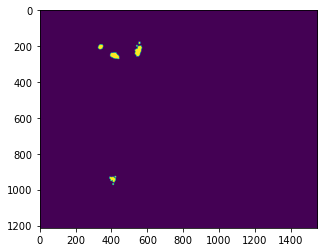

In [13]:
plt.imshow(ds1['image_dilated']);plt.imshow(ds1['mask']);

In [13]:
gray = cv2.cvtColor(np.array(img), cv2.COLOR_RGBA2GRAY)

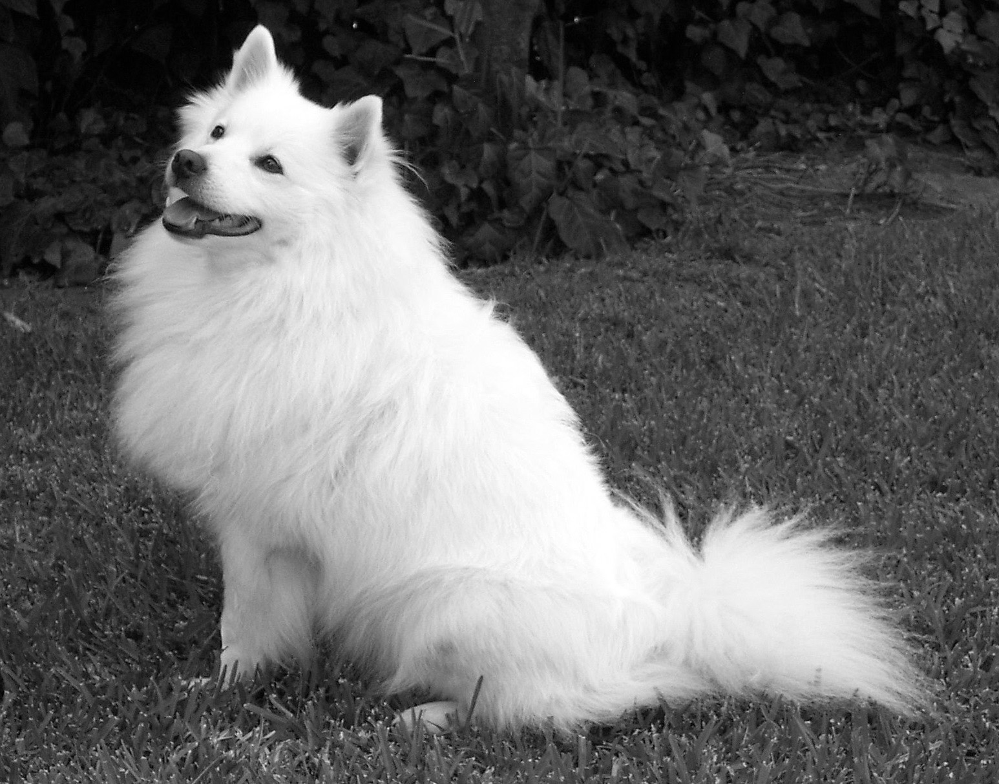

In [14]:
Image.fromarray(gray)

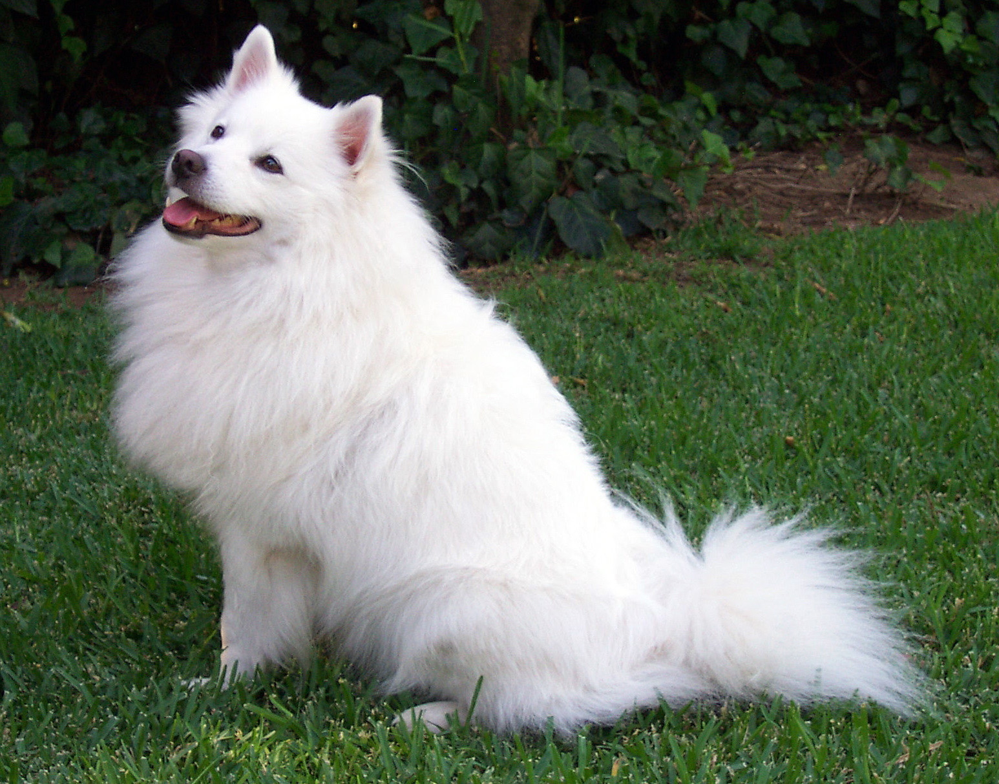

In [18]:
origin = cv2.imread(path)
# origin = cv2.cvtColor(origin, cv2.COLOR_BGR2GRAY)
origin = cv2.cvtColor(origin, cv2.COLOR_BGR2RGB)
Image.fromarray(origin)

In [15]:
import imageio

origin = cv2.imread(path)
# origin = cv2.cvtColor(origin, cv2.COLOR_BGR2GRAY)
origin = cv2.cvtColor(origin, cv2.COLOR_BGR2RGB)
gray= cv2.cvtColor(origin, cv2.COLOR_RGB2GRAY)

ds = kmeans_seg(np.array(gray))

In [20]:
ds.keys()

dict_keys(['image_origin', 'image_normalized', 'image_dilated', 'image_labels', 'label_values', 'mask', 'mask_applied'])

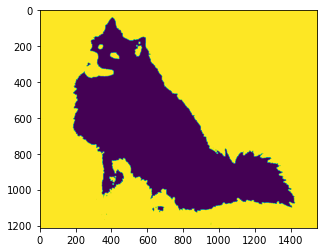

In [24]:
# Image.fromarray(ds['image_origin'])
plt.imshow(ds['image_dilated'])

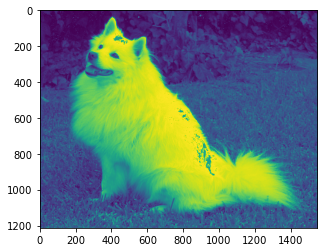

In [27]:
plt.imshow(ds['image_normalized'])